In [1]:
pwd

'/Users/aidasaglinskas/Desktop/BC-FacExpr-1.2-fMRI-mainExp'

In [2]:
from matplotlib import pyplot as plt
from PIL import Image, ImageEnhance,ImageStat
import skvideo
import skvideo.io
import numpy as np
import os
from tqdm import tqdm

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [3]:
def load_video(fn):
    videodata = skvideo.io.vread(fn)
    return videodata

In [4]:
files = [os.path.join('./stimuli_cropped/',file) for file in os.listdir('./stimuli_cropped/') if file.endswith('.mp4')]
files.sort()
files[0:5]

['./stimuli_cropped/id1d1.mp4',
 './stimuli_cropped/id1d2.mp4',
 './stimuli_cropped/id1f1.mp4',
 './stimuli_cropped/id1f2.mp4',
 './stimuli_cropped/id1h1.mp4']

In [5]:
len(files)

70

In [6]:
hist_brightness = []
hist_contrast = []
hist_r = []
hist_g = []
hist_b = []
for file in tqdm(files):
    vid = load_video(file)
    hist_brightness.append(  get_face(vid[0,:,:,:]).mean()  )
    hist_contrast.append(  get_face(vid[0,:,:,:]).mean(axis=-1).std() )
    
    hist_r.append( vid[:,:,:,0].mean() )
    hist_g.append( vid[:,:,:,1].mean() )
    hist_b.append( vid[:,:,:,2].mean() )

  0%|                                                    | 0/70 [00:03<?, ?it/s]


NameError: name 'get_face' is not defined

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.hist(hist_brightness);
plt.title('brightness');
plt.subplot(1,3,2)
plt.hist(hist_contrast);
plt.title('contrast');
plt.subplot(1,3,3)
plt.hist(hist_r,color='r',alpha=.5);
plt.hist(hist_g,color='g',alpha=.5);
plt.hist(hist_b,color='b',alpha=.5);
plt.title('rgb hist');

In [ ]:
brightness_target = np.array(hist_brightness).mean()
brightness_target.round(3)

In [61]:
contrast_target = np.array(hist_contrast).mean()
contrast_target.round(3)

34.715

In [62]:
target_r = np.array(hist_r).mean().round(3)
target_g = np.array(hist_g).mean().round(3)
target_b = np.array(hist_b).mean().round(3)
(target_r,target_g,target_b)

(84.384, 70.815, 76.017)

In [63]:
def brighten_video(videodata,factor=1):
    return np.array([np.array(ImageEnhance.Brightness(Image.fromarray(videodata[frame,:,:,:])).enhance(factor)) for frame in range(videodata.shape[0])])

def contrast_video(videodata,factor=1):
    return np.array([np.array(ImageEnhance.Contrast(Image.fromarray(videodata[frame,:,:,:])).enhance(factor)) for frame in range(videodata.shape[0])])

In [65]:
def save_video(videodata,ofn='outvideo.mp4'):
    skvideo.io.vwrite(ofn, videodata.astype(np.uint8),outputdict={'-codec': 'h264', '-filter:v' : 'fps=29.97'})

In [66]:
def tint_video(videodata,ctargets,bw=False): 
    #ctargets = (target_r,target_g,target_b)
    videodata_copy = videodata.copy()
    videodata_copy = videodata_copy.astype(np.float16) # otherwise 255 overflows and you get patches
    for frame in range(videodata.shape[0]):
        for channel in range(3):
            if bw==False:
                c_diff = ctargets[channel]-videodata_copy[frame,:,:,channel].mean()
                videodata_copy[frame,:,:,channel] = videodata_copy[frame,:,:,channel]+c_diff
                videodata_copy[videodata_copy>255]=255
                videodata_copy[videodata_copy<0]=0
                
            else:
                bw_frame = np.array(Image.fromarray(videodata_copy[frame,:,:,:]).convert('L'))
                videodata_copy[frame,:,:,channel] = bw_frame
                
    videodata_copy = videodata_copy.astype(np.uint8)
    return videodata_copy

In [67]:
def get_face(frame,l=50):
    return frame[256-l:256+l,256-l:256+l,:]

In [72]:
np.arange(0,70,10)

array([ 0, 10, 20, 30, 40, 50, 60])

22.833220044877105
98.36626666666666


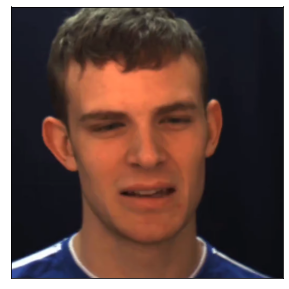

In [83]:
fn = files[f]
videodata = load_video(fn)

plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
plt.imshow(videodata[0,:,:,:]);plt.xticks([]);plt.yticks([]);

contrast = get_face(videodata[0,:,:,:]).mean(axis=-1).std()
brightness = get_face(videodata[0,:,:,:]).mean()

print(contrast)
print(brightness)

In [89]:
contrast_target = 20
brightness_target = 125

  0%|                                                    | 0/70 [00:00<?, ?it/s]

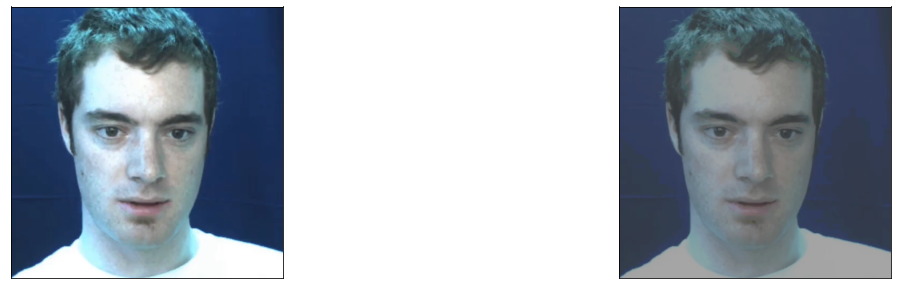

  1%|▋                                           | 1/70 [00:07<08:39,  7.52s/it]

<Figure size 432x288 with 0 Axes>

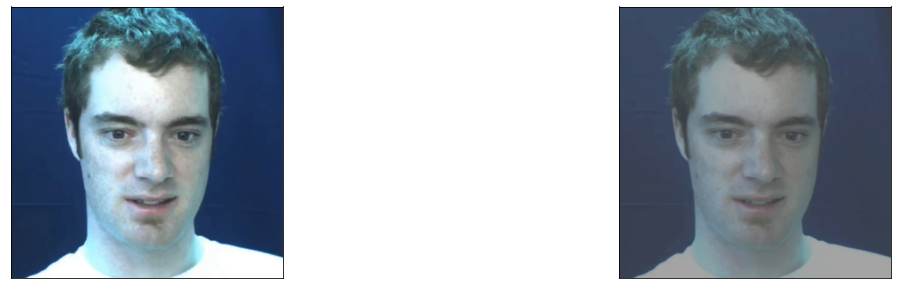

  3%|█▎                                          | 2/70 [00:14<08:28,  7.48s/it]

<Figure size 432x288 with 0 Axes>

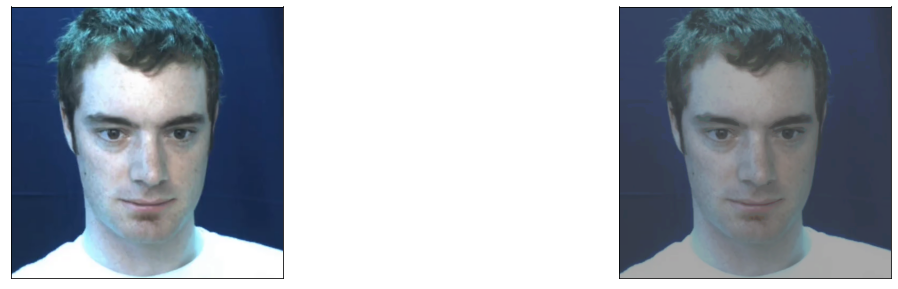

  4%|█▉                                          | 3/70 [00:22<08:19,  7.45s/it]

<Figure size 432x288 with 0 Axes>

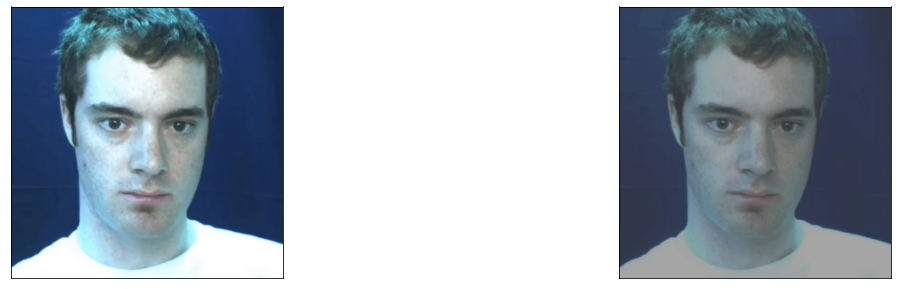

  6%|██▌                                         | 4/70 [00:30<08:17,  7.53s/it]

<Figure size 432x288 with 0 Axes>

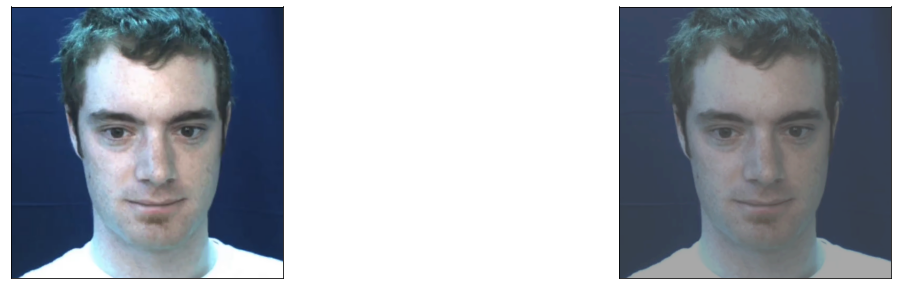

  7%|███▏                                        | 5/70 [00:36<07:55,  7.31s/it]

<Figure size 432x288 with 0 Axes>

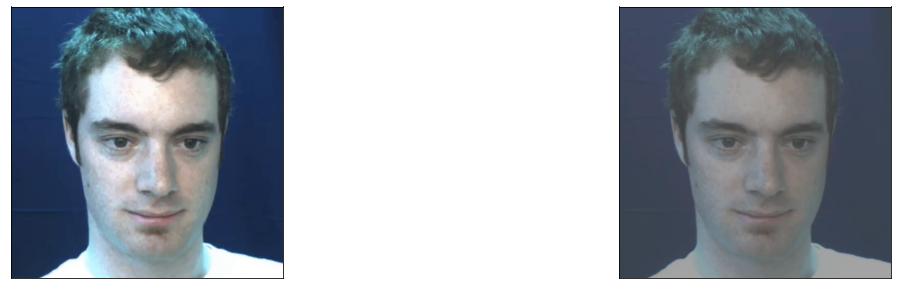

  9%|███▊                                        | 6/70 [00:43<07:28,  7.00s/it]

<Figure size 432x288 with 0 Axes>

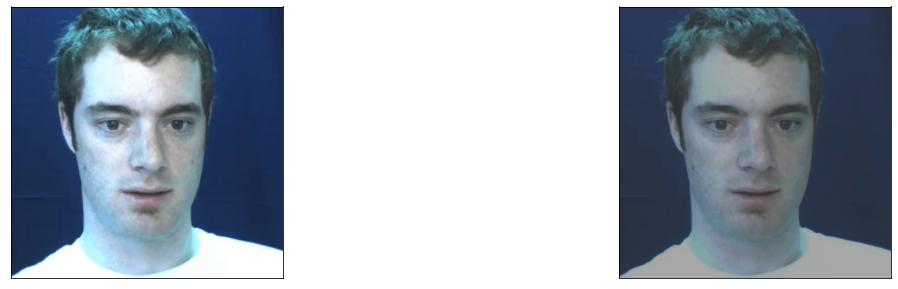

 10%|████▍                                       | 7/70 [00:49<07:07,  6.79s/it]

<Figure size 432x288 with 0 Axes>

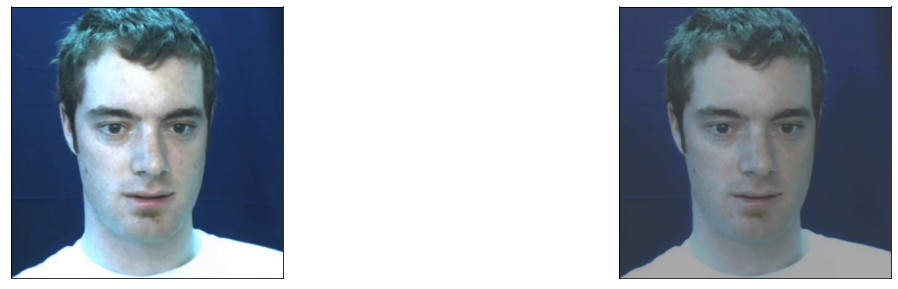

 11%|█████                                       | 8/70 [00:56<06:55,  6.71s/it]

<Figure size 432x288 with 0 Axes>

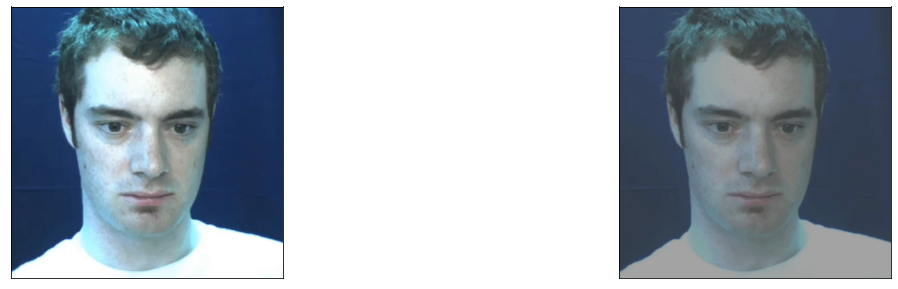

 13%|█████▋                                      | 9/70 [01:05<07:40,  7.55s/it]

<Figure size 432x288 with 0 Axes>

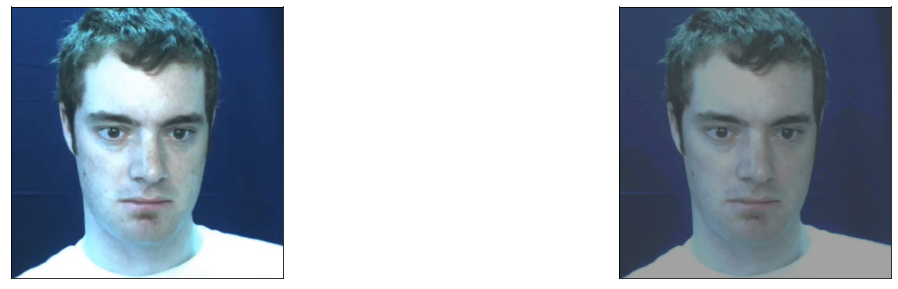

 14%|██████▏                                    | 10/70 [01:12<07:14,  7.24s/it]

<Figure size 432x288 with 0 Axes>

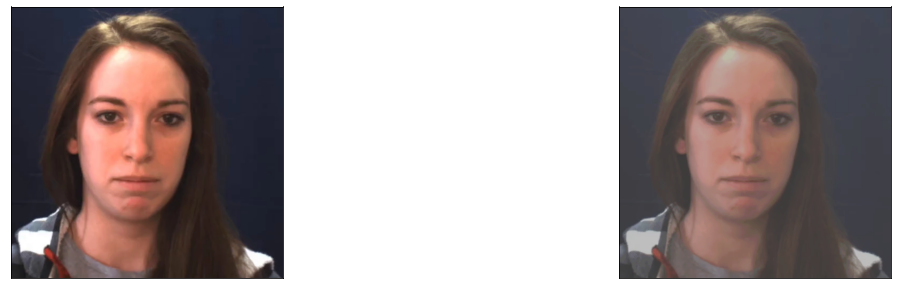

 16%|██████▊                                    | 11/70 [01:18<06:52,  7.00s/it]

<Figure size 432x288 with 0 Axes>

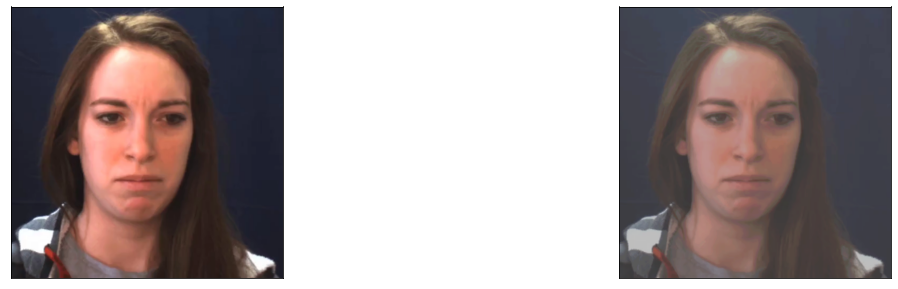

 17%|███████▎                                   | 12/70 [01:26<06:56,  7.19s/it]

<Figure size 432x288 with 0 Axes>

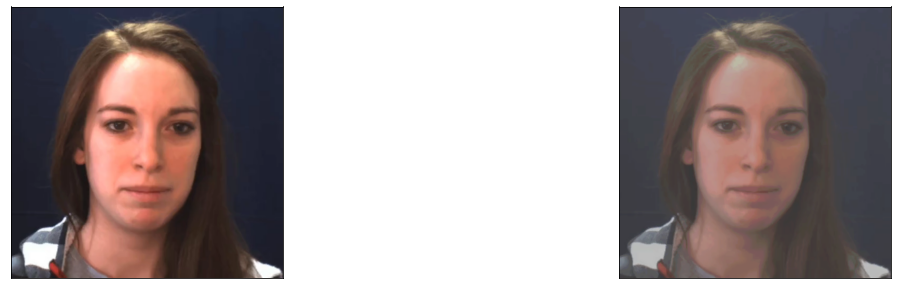

 19%|███████▉                                   | 13/70 [01:33<06:47,  7.14s/it]

<Figure size 432x288 with 0 Axes>

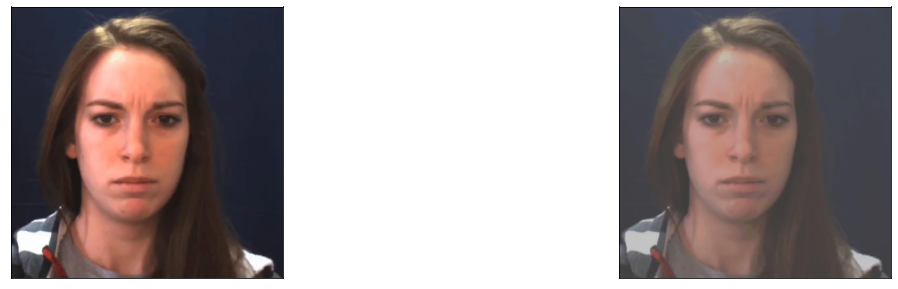

 20%|████████▌                                  | 14/70 [01:41<06:51,  7.35s/it]

<Figure size 432x288 with 0 Axes>

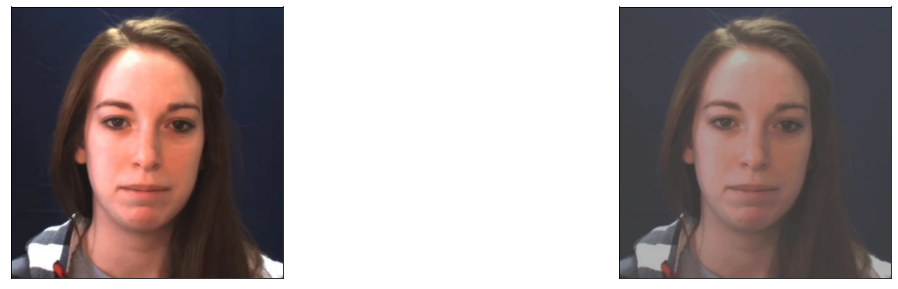

 21%|█████████▏                                 | 15/70 [01:47<06:32,  7.13s/it]

<Figure size 432x288 with 0 Axes>

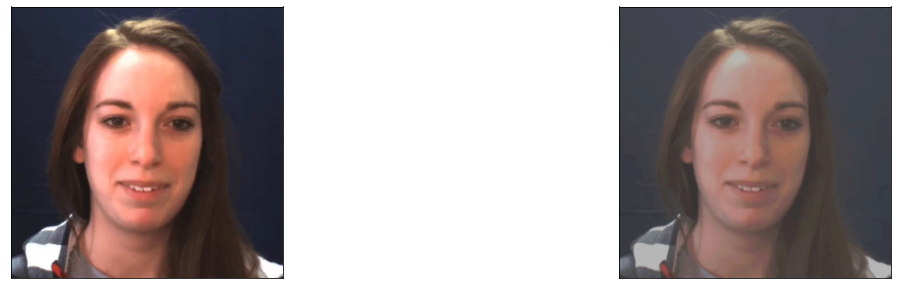

 23%|█████████▊                                 | 16/70 [01:54<06:17,  6.99s/it]

<Figure size 432x288 with 0 Axes>

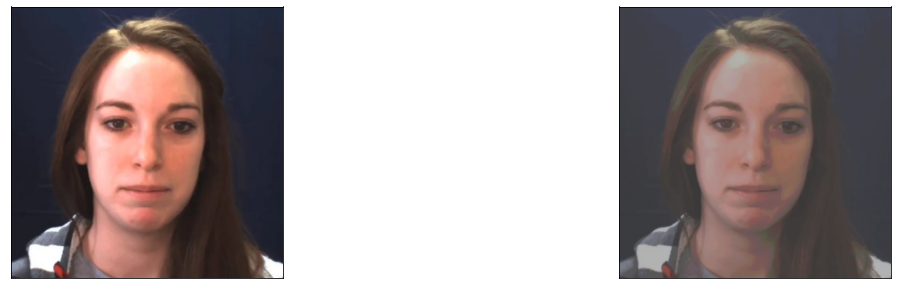

 24%|██████████▍                                | 17/70 [02:01<06:07,  6.93s/it]

<Figure size 432x288 with 0 Axes>

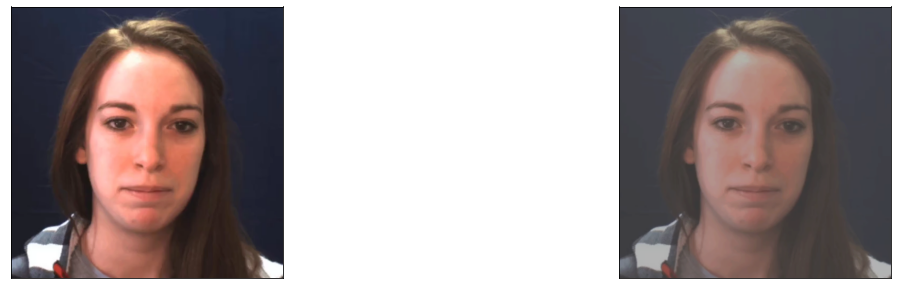

 26%|███████████                                | 18/70 [02:08<05:58,  6.90s/it]

<Figure size 432x288 with 0 Axes>

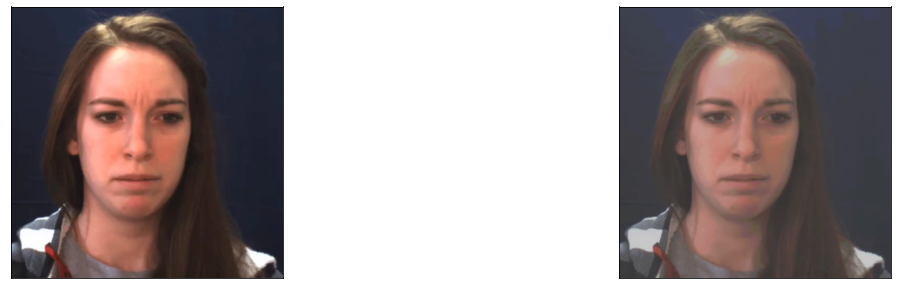

 27%|███████████▋                               | 19/70 [02:15<05:53,  6.94s/it]

<Figure size 432x288 with 0 Axes>

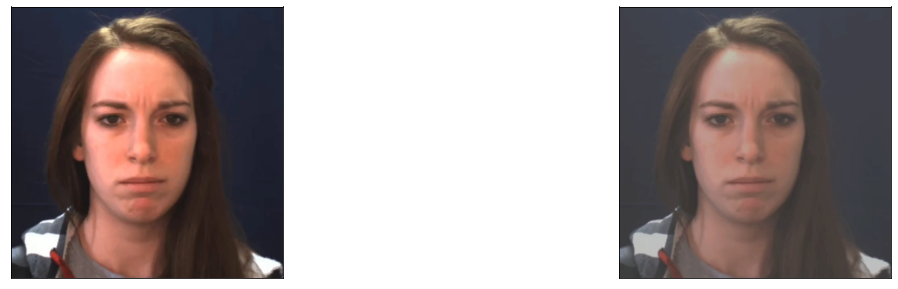

 29%|████████████▎                              | 20/70 [02:21<05:40,  6.82s/it]

<Figure size 432x288 with 0 Axes>

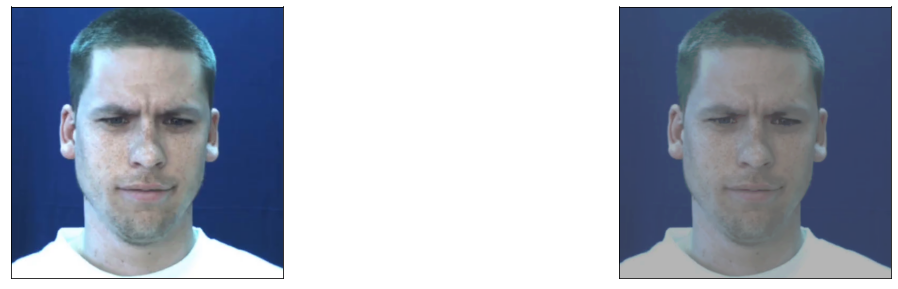

 30%|████████████▉                              | 21/70 [02:28<05:38,  6.91s/it]

<Figure size 432x288 with 0 Axes>

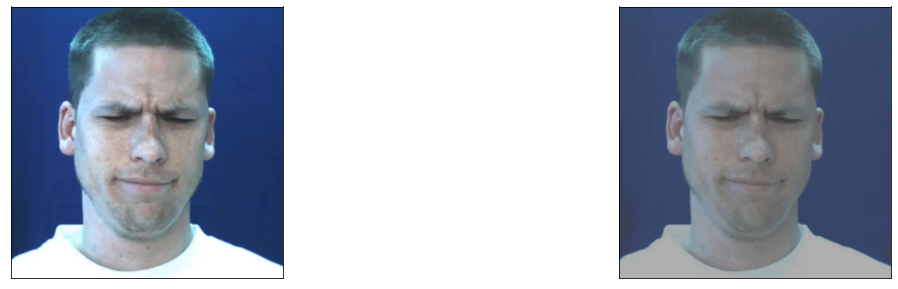

 31%|█████████████▌                             | 22/70 [02:35<05:28,  6.85s/it]

<Figure size 432x288 with 0 Axes>

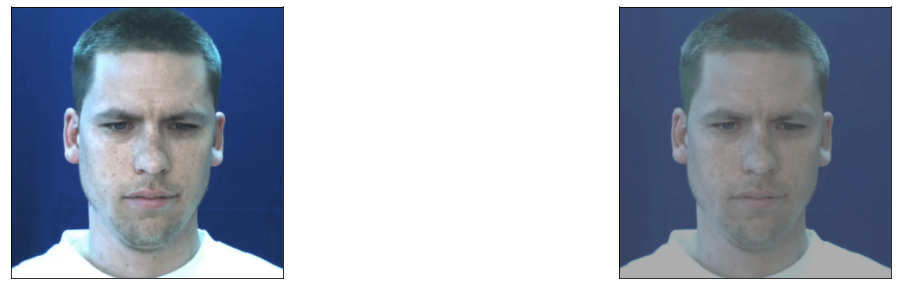

 33%|██████████████▏                            | 23/70 [02:42<05:27,  6.98s/it]

<Figure size 432x288 with 0 Axes>

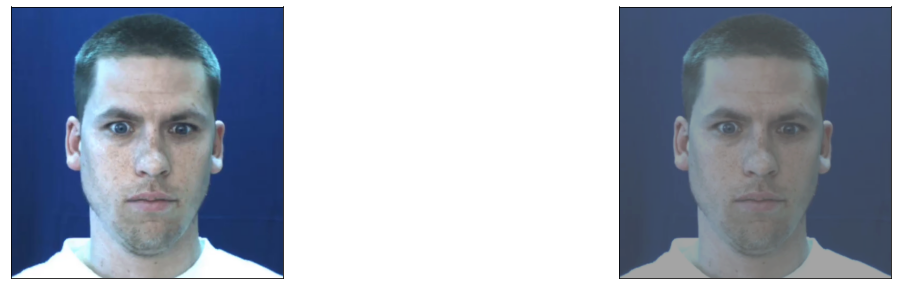

 34%|██████████████▋                            | 24/70 [02:49<05:20,  6.96s/it]

<Figure size 432x288 with 0 Axes>

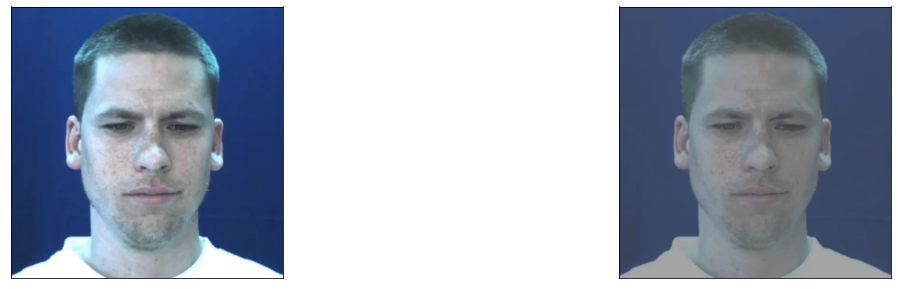

 36%|███████████████▎                           | 25/70 [02:56<05:10,  6.89s/it]

<Figure size 432x288 with 0 Axes>

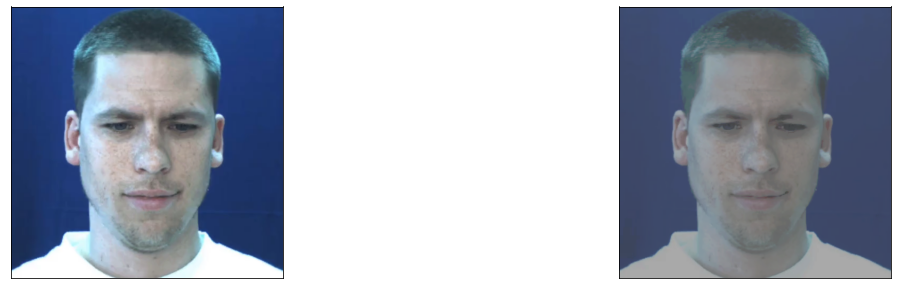

 37%|███████████████▉                           | 26/70 [03:03<05:02,  6.87s/it]

<Figure size 432x288 with 0 Axes>

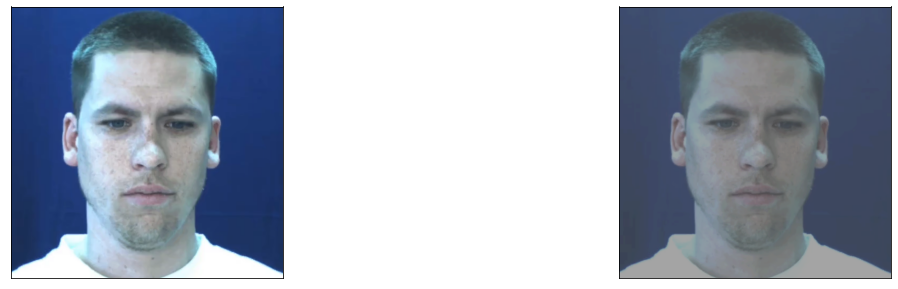

 39%|████████████████▌                          | 27/70 [03:09<04:52,  6.80s/it]

<Figure size 432x288 with 0 Axes>

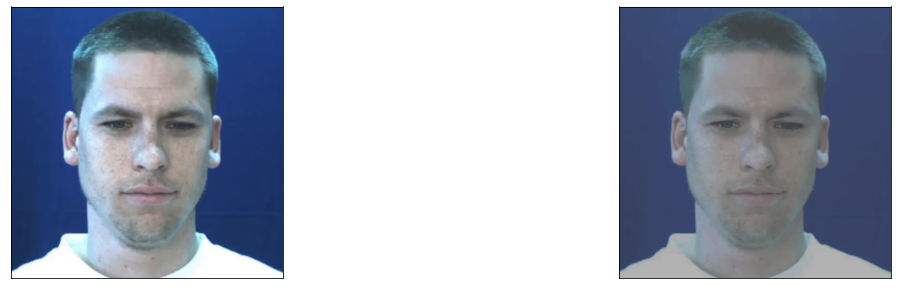

 40%|█████████████████▏                         | 28/70 [03:17<04:53,  6.99s/it]

<Figure size 432x288 with 0 Axes>

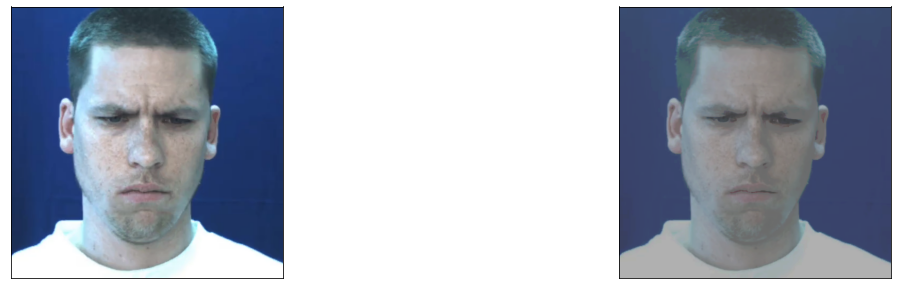

 41%|█████████████████▊                         | 29/70 [03:24<04:46,  7.00s/it]

<Figure size 432x288 with 0 Axes>

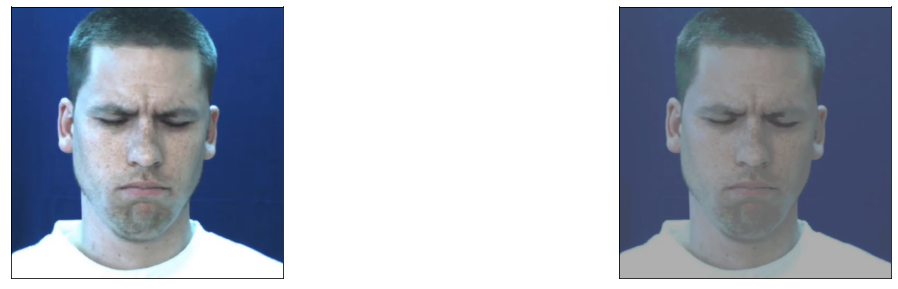

 43%|██████████████████▍                        | 30/70 [03:30<04:33,  6.85s/it]

<Figure size 432x288 with 0 Axes>

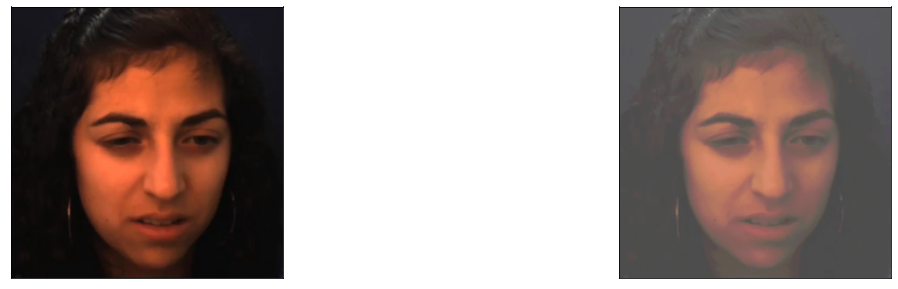

 44%|███████████████████                        | 31/70 [03:37<04:28,  6.88s/it]

<Figure size 432x288 with 0 Axes>

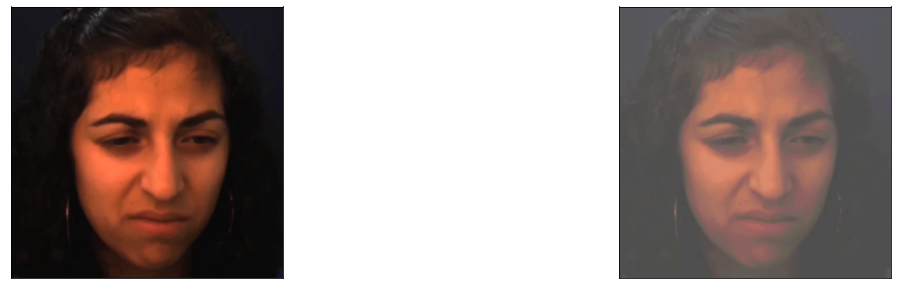

 46%|███████████████████▋                       | 32/70 [03:44<04:25,  6.97s/it]

<Figure size 432x288 with 0 Axes>

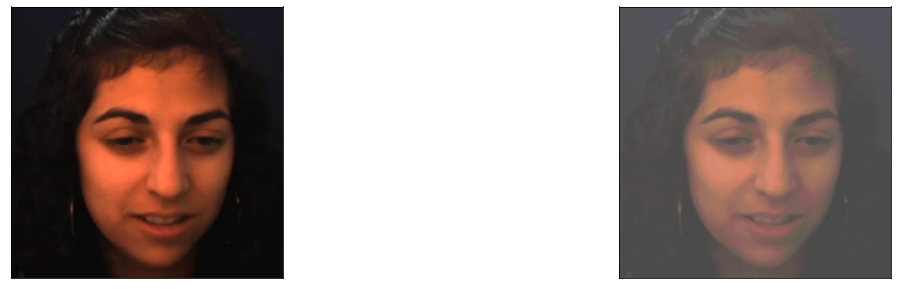

 47%|████████████████████▎                      | 33/70 [03:53<04:33,  7.38s/it]

<Figure size 432x288 with 0 Axes>

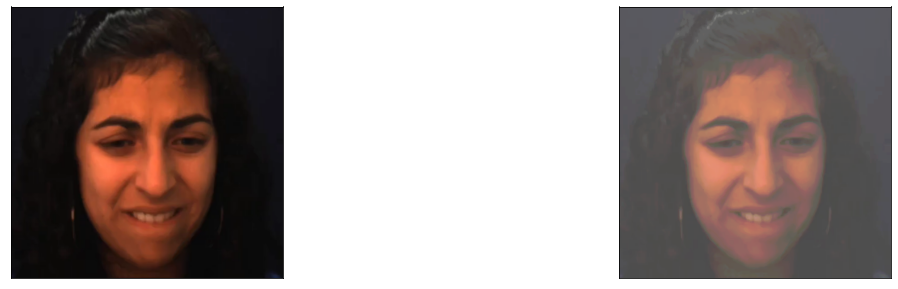

 49%|████████████████████▉                      | 34/70 [04:00<04:24,  7.34s/it]

<Figure size 432x288 with 0 Axes>

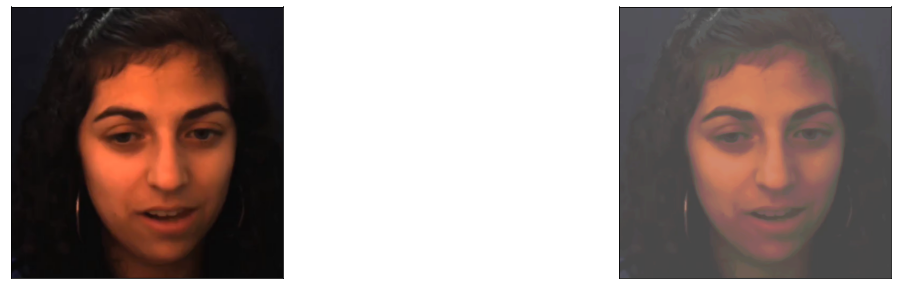

 50%|█████████████████████▌                     | 35/70 [04:08<04:19,  7.41s/it]

<Figure size 432x288 with 0 Axes>

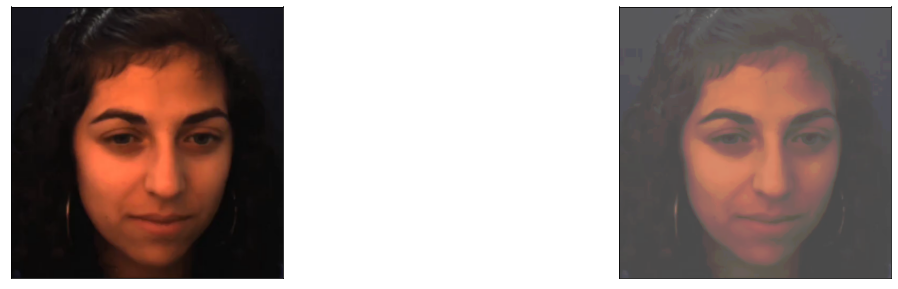

 51%|██████████████████████                     | 36/70 [04:16<04:20,  7.66s/it]

<Figure size 432x288 with 0 Axes>

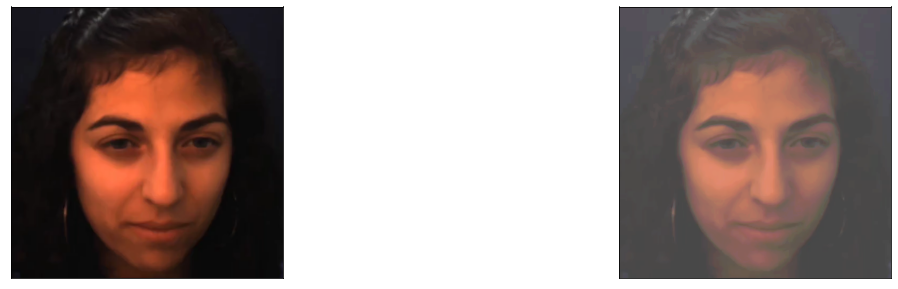

 53%|██████████████████████▋                    | 37/70 [04:23<04:09,  7.55s/it]

<Figure size 432x288 with 0 Axes>

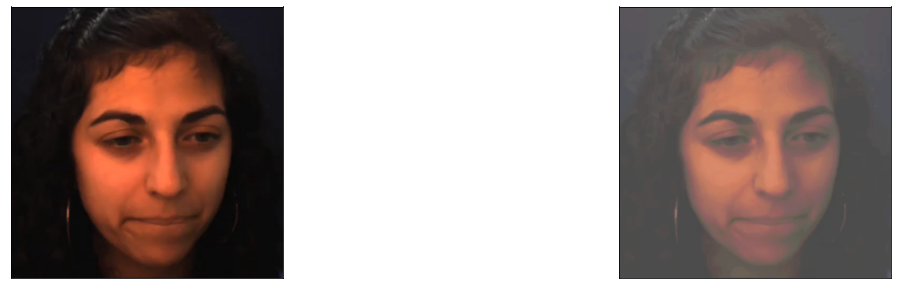

 54%|███████████████████████▎                   | 38/70 [04:30<03:59,  7.48s/it]

<Figure size 432x288 with 0 Axes>

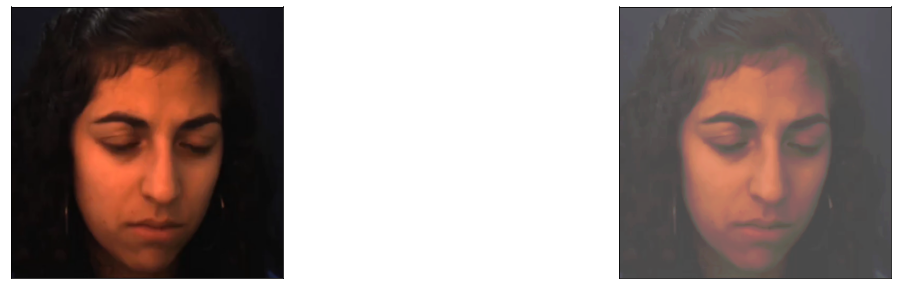

 56%|███████████████████████▉                   | 39/70 [04:38<03:49,  7.41s/it]

<Figure size 432x288 with 0 Axes>

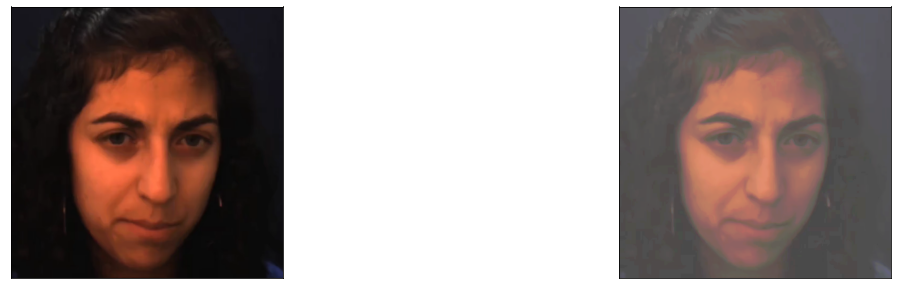

 57%|████████████████████████▌                  | 40/70 [04:45<03:38,  7.27s/it]

<Figure size 432x288 with 0 Axes>

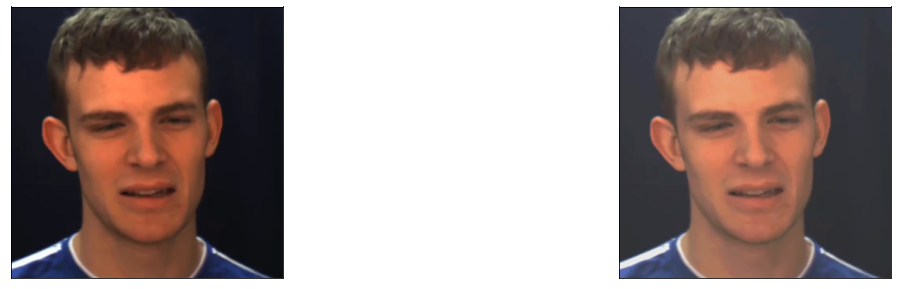

 59%|█████████████████████████▏                 | 41/70 [04:51<03:25,  7.08s/it]

<Figure size 432x288 with 0 Axes>

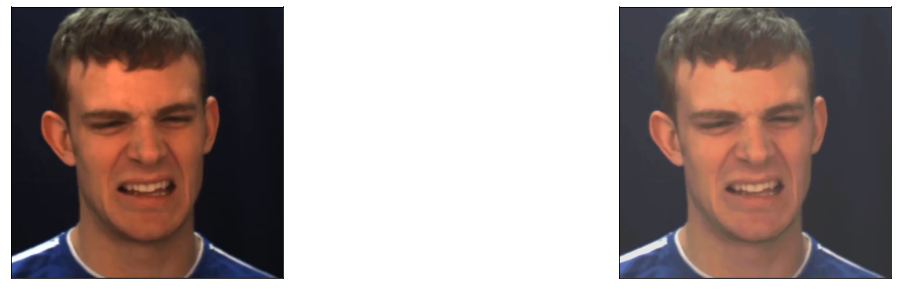

 60%|█████████████████████████▊                 | 42/70 [04:58<03:14,  6.94s/it]

<Figure size 432x288 with 0 Axes>

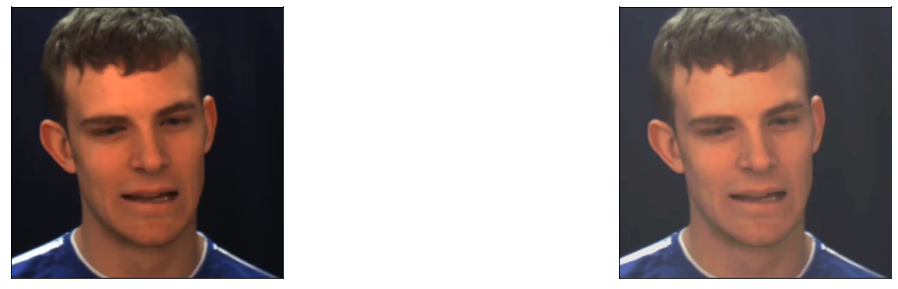

 61%|██████████████████████████▍                | 43/70 [05:04<03:04,  6.84s/it]

<Figure size 432x288 with 0 Axes>

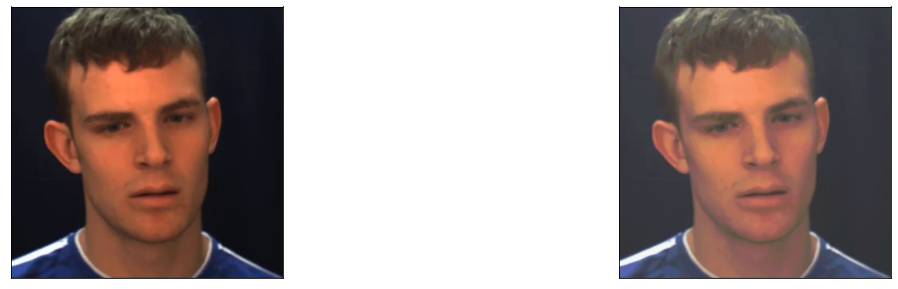

 63%|███████████████████████████                | 44/70 [05:11<02:56,  6.79s/it]

<Figure size 432x288 with 0 Axes>

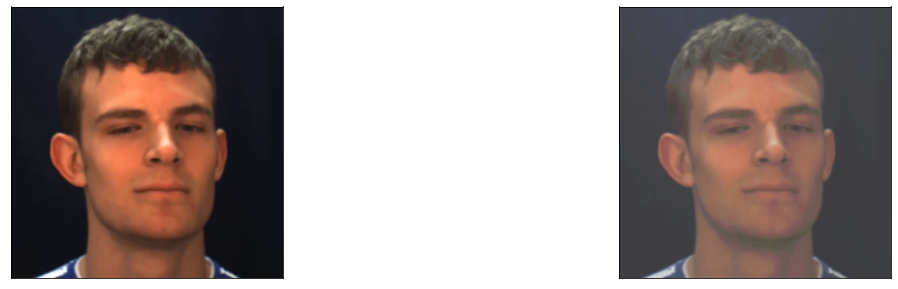

 64%|███████████████████████████▋               | 45/70 [05:18<02:50,  6.82s/it]

<Figure size 432x288 with 0 Axes>

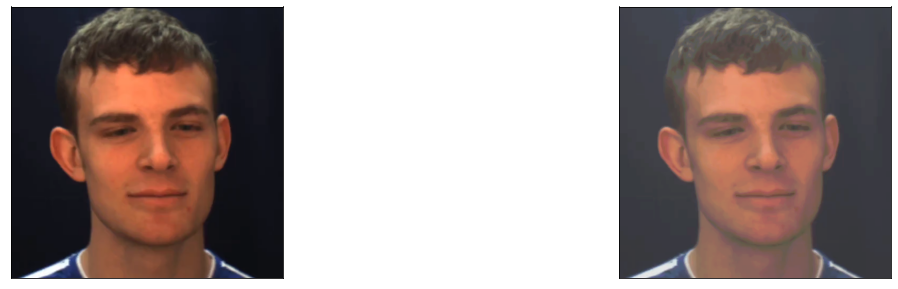

 66%|████████████████████████████▎              | 46/70 [05:25<02:45,  6.88s/it]

<Figure size 432x288 with 0 Axes>

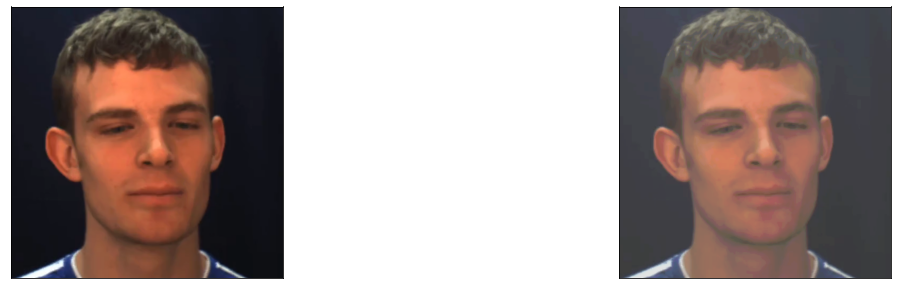

 67%|████████████████████████████▊              | 47/70 [05:32<02:36,  6.79s/it]

<Figure size 432x288 with 0 Axes>

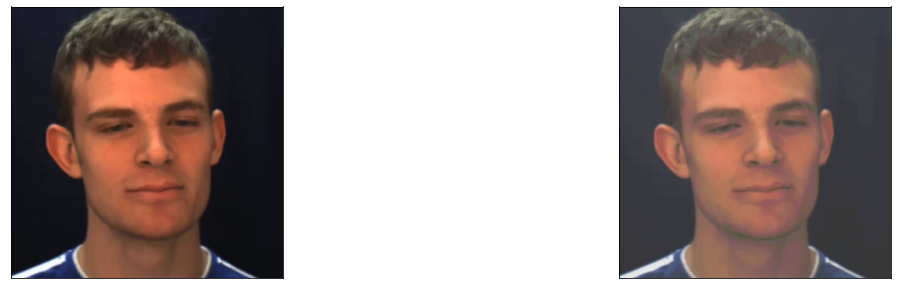

 69%|█████████████████████████████▍             | 48/70 [05:38<02:28,  6.74s/it]

<Figure size 432x288 with 0 Axes>

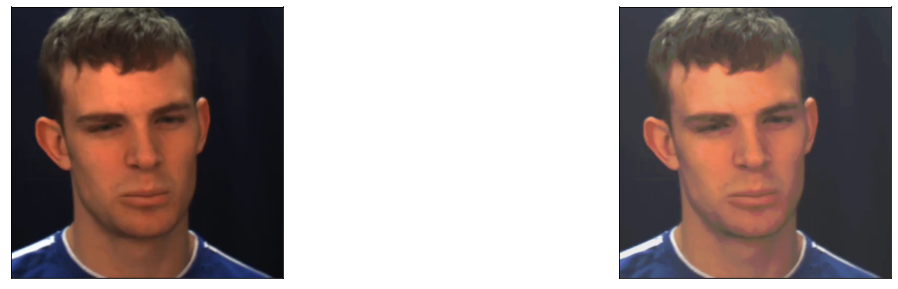

 70%|██████████████████████████████             | 49/70 [05:45<02:21,  6.74s/it]

<Figure size 432x288 with 0 Axes>

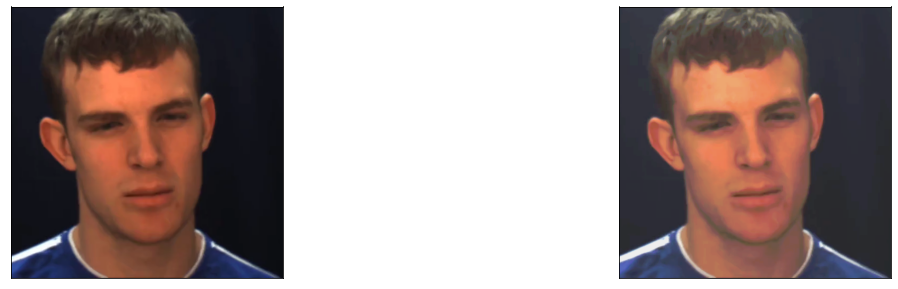

 71%|██████████████████████████████▋            | 50/70 [05:51<02:12,  6.63s/it]

<Figure size 432x288 with 0 Axes>

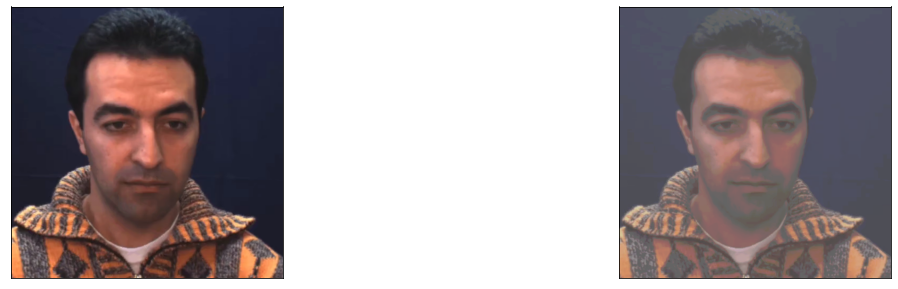

 73%|███████████████████████████████▎           | 51/70 [05:58<02:05,  6.59s/it]

<Figure size 432x288 with 0 Axes>

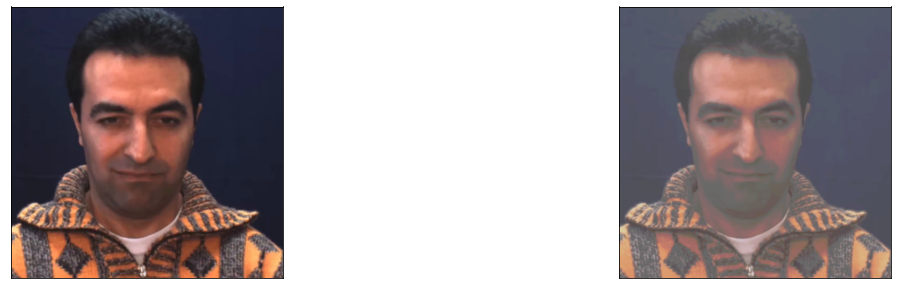

 74%|███████████████████████████████▉           | 52/70 [06:05<01:59,  6.63s/it]

<Figure size 432x288 with 0 Axes>

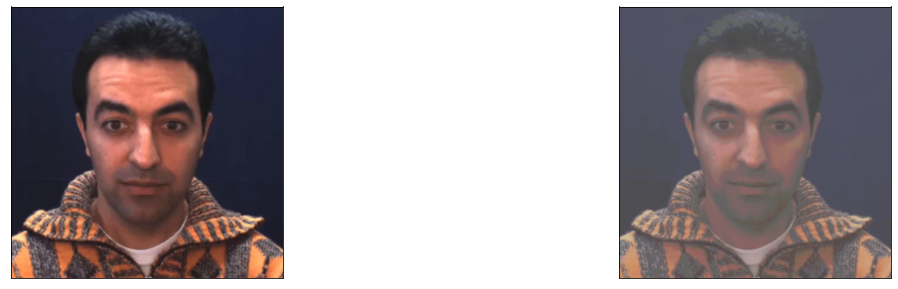

 76%|████████████████████████████████▌          | 53/70 [06:11<01:52,  6.62s/it]

<Figure size 432x288 with 0 Axes>

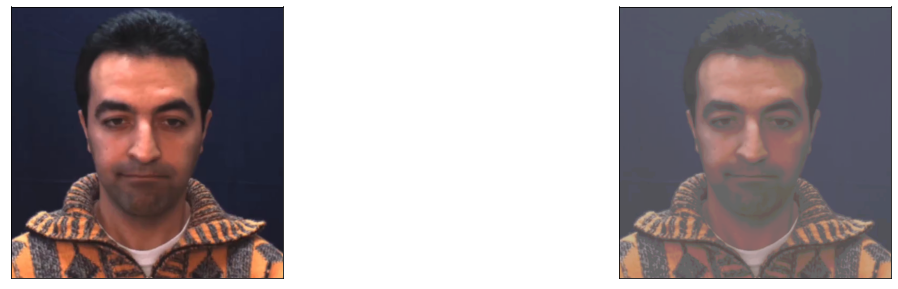

 77%|█████████████████████████████████▏         | 54/70 [06:18<01:46,  6.63s/it]

<Figure size 432x288 with 0 Axes>

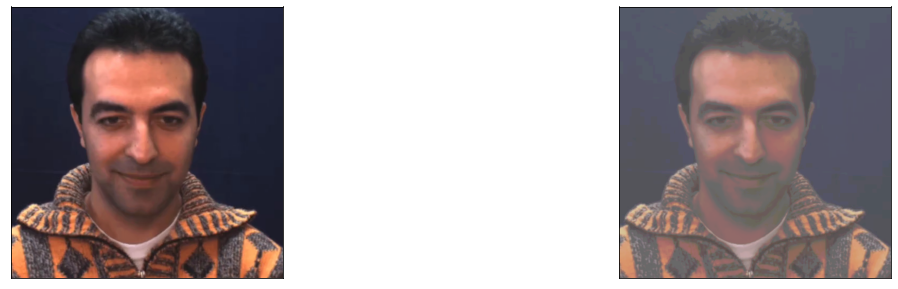

 79%|█████████████████████████████████▊         | 55/70 [06:25<01:41,  6.76s/it]

<Figure size 432x288 with 0 Axes>

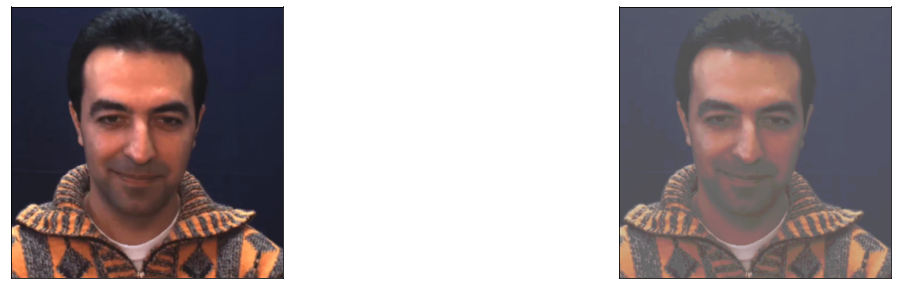

 80%|██████████████████████████████████▍        | 56/70 [06:31<01:33,  6.70s/it]

<Figure size 432x288 with 0 Axes>

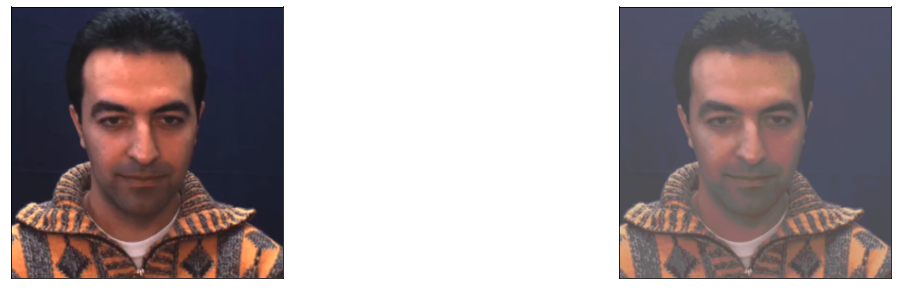

 81%|███████████████████████████████████        | 57/70 [06:38<01:27,  6.76s/it]

<Figure size 432x288 with 0 Axes>

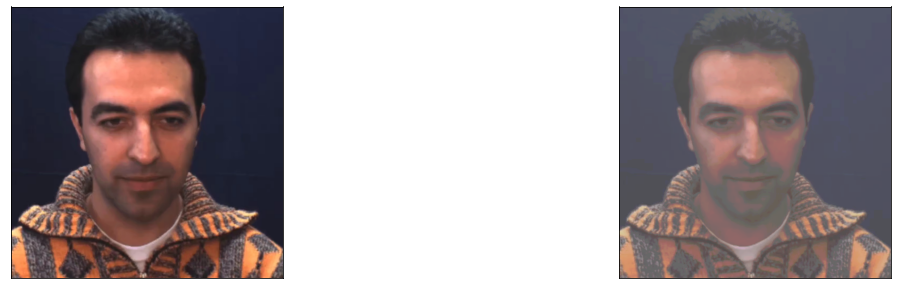

 83%|███████████████████████████████████▋       | 58/70 [06:45<01:20,  6.71s/it]

<Figure size 432x288 with 0 Axes>

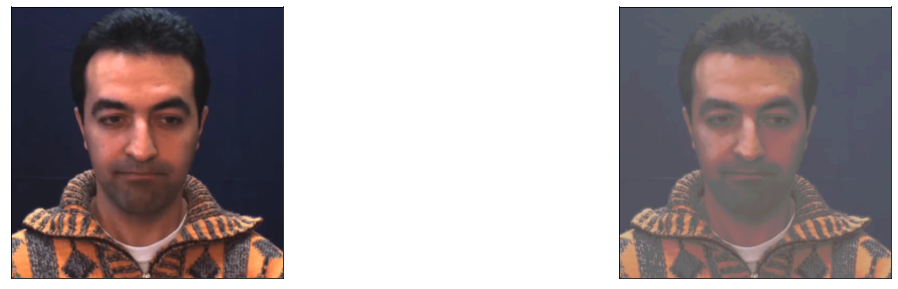

 84%|████████████████████████████████████▏      | 59/70 [06:52<01:14,  6.76s/it]

<Figure size 432x288 with 0 Axes>

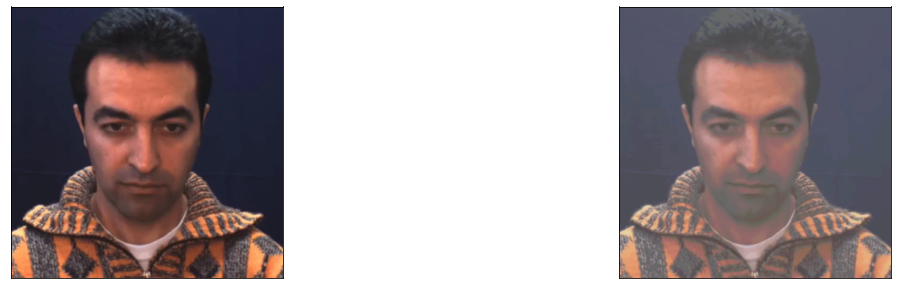

 86%|████████████████████████████████████▊      | 60/70 [06:58<01:07,  6.72s/it]

<Figure size 432x288 with 0 Axes>

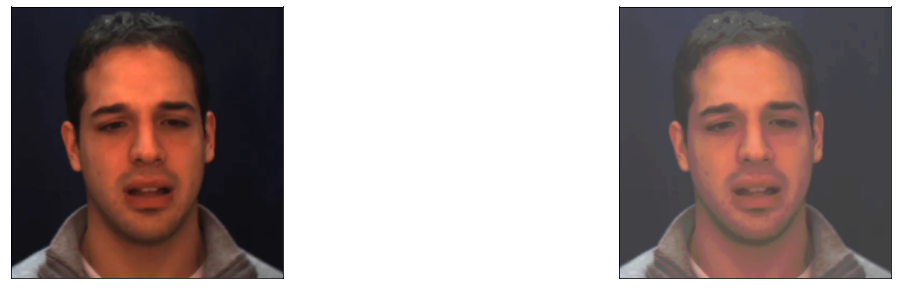

 87%|█████████████████████████████████████▍     | 61/70 [07:05<01:00,  6.69s/it]

<Figure size 432x288 with 0 Axes>

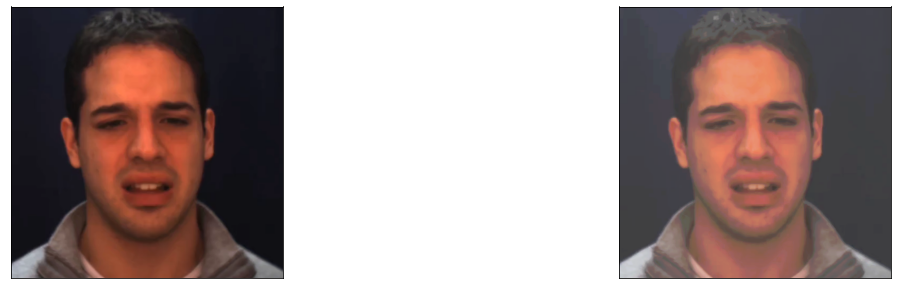

 89%|██████████████████████████████████████     | 62/70 [07:12<00:53,  6.67s/it]

<Figure size 432x288 with 0 Axes>

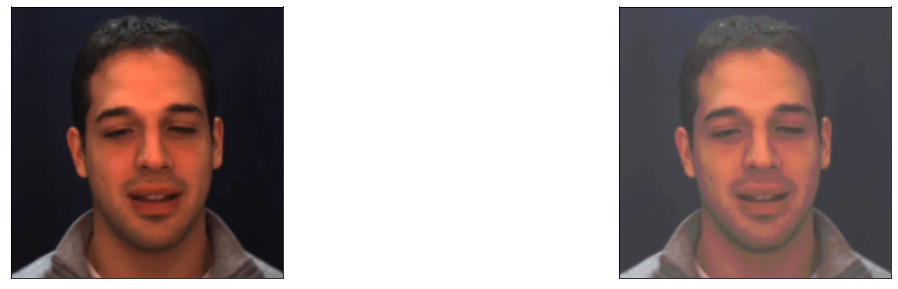

 90%|██████████████████████████████████████▋    | 63/70 [07:18<00:46,  6.69s/it]

<Figure size 432x288 with 0 Axes>

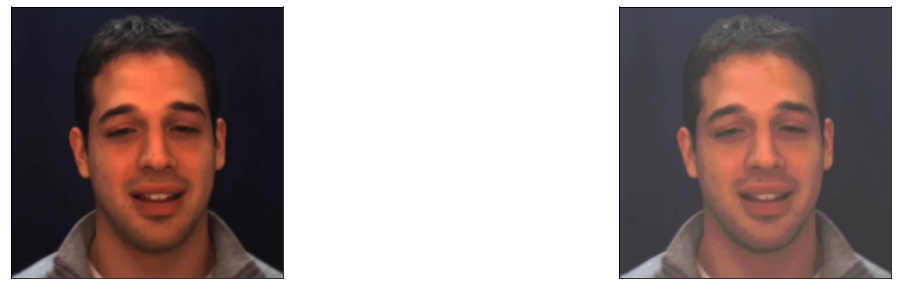

 91%|███████████████████████████████████████▎   | 64/70 [07:25<00:40,  6.68s/it]

<Figure size 432x288 with 0 Axes>

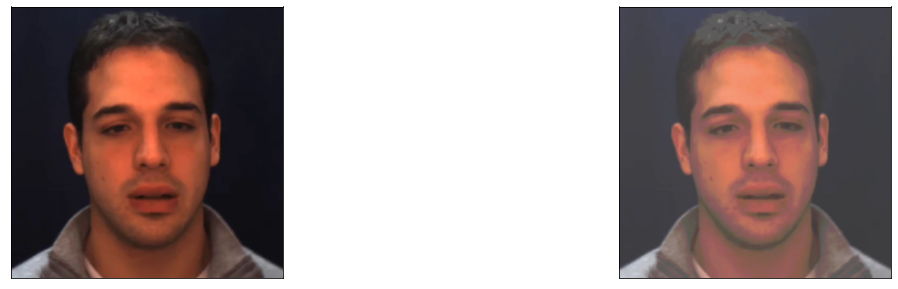

 93%|███████████████████████████████████████▉   | 65/70 [07:32<00:33,  6.76s/it]

<Figure size 432x288 with 0 Axes>

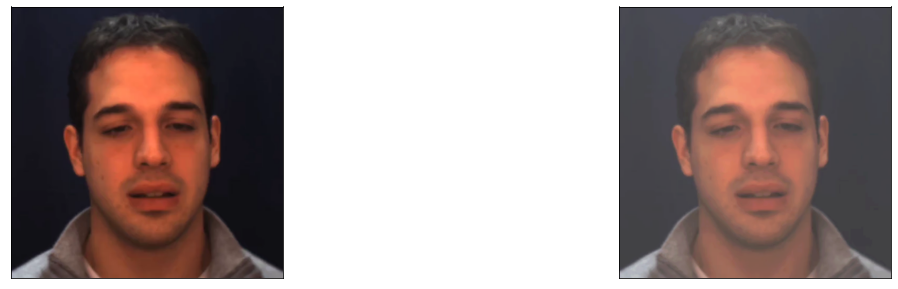

 94%|████████████████████████████████████████▌  | 66/70 [07:39<00:26,  6.74s/it]

<Figure size 432x288 with 0 Axes>

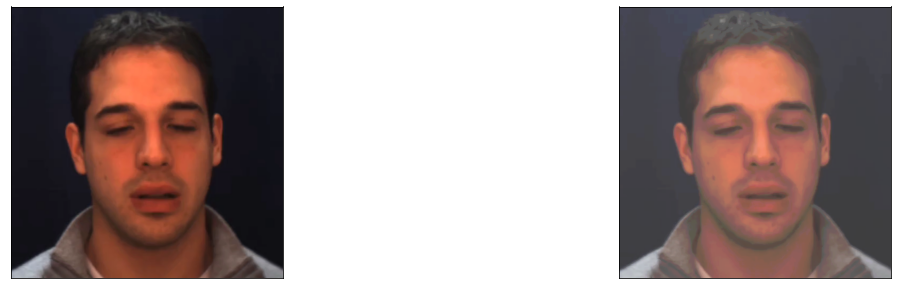

 96%|█████████████████████████████████████████▏ | 67/70 [07:46<00:20,  6.76s/it]

<Figure size 432x288 with 0 Axes>

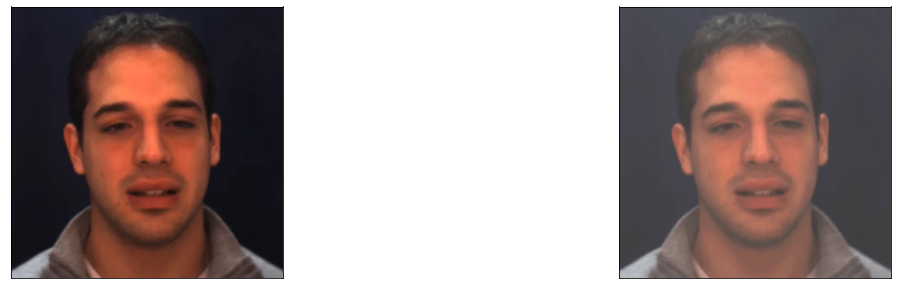

 97%|█████████████████████████████████████████▊ | 68/70 [07:52<00:13,  6.69s/it]

<Figure size 432x288 with 0 Axes>

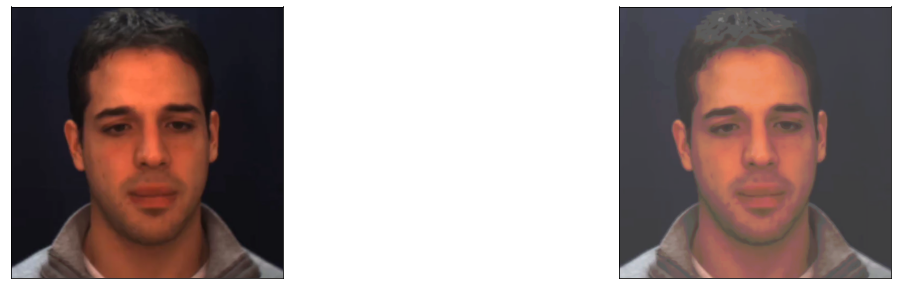

 99%|██████████████████████████████████████████▍| 69/70 [07:59<00:06,  6.74s/it]

<Figure size 432x288 with 0 Axes>

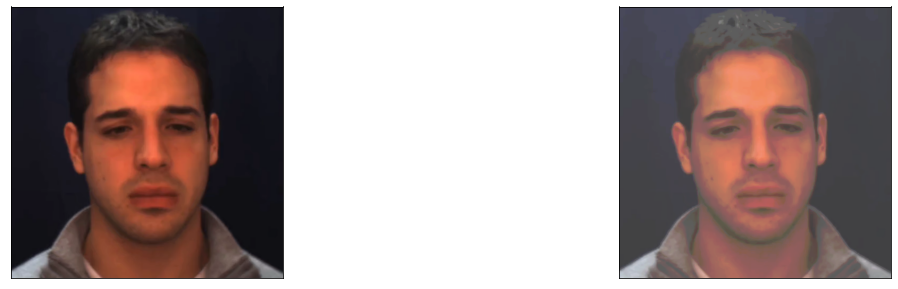

100%|███████████████████████████████████████████| 70/70 [08:06<00:00,  6.94s/it]


<Figure size 432x288 with 0 Axes>

In [96]:
# NORMALIZE TO TARGET VALUES
for f in tqdm(range(len(files))):
#for f in tqdm(  np.arange(0,145,15)  ):
#for f in tqdm(range(len(files))):
#for f in tqdm( np.arange(0,70,10) ):
#for f in [40]:
    fn = files[f]
    videodata = load_video(fn)
    
    plt.figure(figsize=(20,5))
    plt.subplot(1,2,1)
    plt.imshow(videodata[0,:,:,:]);plt.xticks([]);plt.yticks([]);

    
    #videodata = tint_video(videodata,(target_r,target_g,target_b),bw=False)
    #plt.subplot(1,4,2)
    #plt.imshow(videodata[0,:,:,:]);plt.xticks([]);plt.yticks([]);
    
    for i in range(25):
        #contrast = videodata[0,:,:,:].mean(axis=-1).std()
        #brightness = videodata[0,:,:,:].mean()
        
        contrast = get_face(videodata[0,:,:,:]).mean(axis=-1).std()
        brightness = get_face(videodata[0,:,:,:]).mean()
        
        videodata = contrast_video(videodata,contrast_target/contrast)
        videodata = brighten_video(videodata,brightness_target/brightness)

    plt.subplot(1,2,2)
    plt.imshow(videodata[0,:,:,:]);plt.xticks([]);plt.yticks([]);
    plt.show()
    plt.tight_layout()
    save_video(videodata,ofn=fn.replace('./stimuli_cropped/','./stimuli_cropped_normed_cb/'))

100%|███████████████████████████████████████████| 70/70 [00:09<00:00,  7.27it/s]


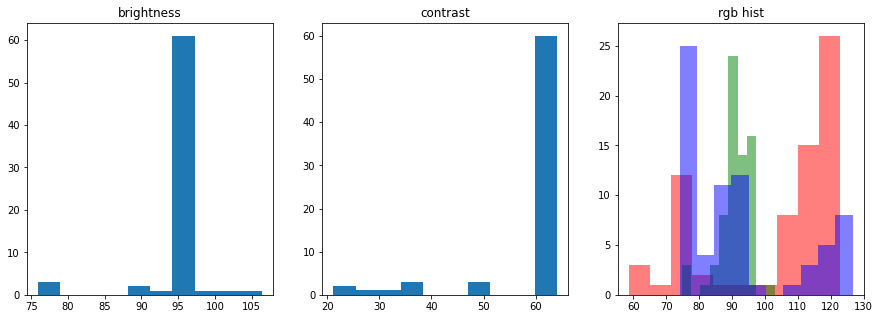

In [92]:
files = [os.path.join('./stimuli_cropped_normed_cb/',file) for file in os.listdir('./stimuli_cropped_normed_cb/') if file.endswith('.mp4')]
files.sort()
files[0:5]

hist_brightness = []
hist_contrast = []

hist_r = []
hist_g = []
hist_b = []


for file in tqdm(files):
    vid = load_video(file)
    hist_brightness.append(  vid[0,:,:,:].mean()  )
    hist_contrast.append(  vid[0,:,:,:].mean(axis=-1).std() )
            
    hist_r.append( vid[0,:,:,0].mean() )
    hist_g.append( vid[0,:,:,1].mean() )
    hist_b.append( vid[0,:,:,2].mean() )

    
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.hist(hist_brightness);
plt.title('brightness');
plt.subplot(1,3,2)
plt.hist(hist_contrast);
plt.title('contrast');
plt.subplot(1,3,3)
plt.hist(hist_r,color='r',alpha=.5);
plt.hist(hist_g,color='g',alpha=.5);
plt.hist(hist_b,color='b',alpha=.5);
plt.title('rgb hist');

In [123]:
np.array(hist_brightness).mean().round(3)

125.516

In [125]:
np.array(hist_contrast).mean().round(3)

28.657

In [121]:
[np.array(i).mean().round(3) for i in [hist_r,hist_g,hist_b]]

[124.844, 131.399, 120.307]